In [2]:
import numpy as np
import datetime
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
import glob

In [13]:
sns.set()

#googleによる「COVID-19感染予測（日本版）」のcsvからデータを抽出する
def pred_data(filename,prefecture):
    gdata = pd.read_csv(filename)
    #指定した都道府県のデータを抽出
    ext = gdata[gdata["prefecture_name"] == prefecture].copy()
    #日付データをdatetime形式に変換
    ext["target_prediction_date"] = pd.to_datetime(ext["target_prediction_date"], format='%Y-%m-%d')
    #日付順にソート
    ext = ext.sort_values(by="target_prediction_date")
    #予測期間
    date_p = ext["target_prediction_date"]
    #累計陽性者数の予測値
    pred = ext["cumulative_confirmed"].values
    #累計陽性者数の予測値の95%予測区間の上限
    pred_q975 = ext["cumulative_confirmed_q0975"].values
    #累計陽性者数の予測値の95%予測区間の下限
    pred_q025 = ext["cumulative_confirmed_q0025"].values
    #新規陽性者数（日別）の予測値
    new_confirmed = ext["new_confirmed"].values
    
    #予測値を算出した基準日
    forecast_date = pd.to_datetime(ext["forecast_date"], format='%Y-%m-%d')
    #予測基準日をMMDDの形式に変換（凡例用）
    f_date = "{:02d}{:02d}".format(forecast_date.iat[0].month,forecast_date.iat[0].day)
    
    return date_p, pred, pred_q975, pred_q025, new_confirmed, f_date

#Code for Japan標準フォーマットに準拠している場合の処理
def standard_format(data):
    data_t = pd.to_datetime(data["公表_年月日"], format='%Y-%m-%d')
    datelist = pd.date_range(start=data_t.min(), end=data_t.max())
    observed = pd.DataFrame({"date": datelist.copy(), "confirmed": 0., "cumulative_confirmed": 0.})
    for i in range(datelist.size):
        observed.iat[i,1] = sum(data_t == observed.iat[i,0])
        if i == 0:
            observed.iat[i,2] = observed.iat[i,1]
        else:
            observed.iat[i,2] = observed.iat[i-1,2] + observed.iat[i,1] 
    return observed

#都道府県別の陽性者数（累計・日別）時系列データを取得
def historic_data(prefecture):
    if prefecture == "TOKYO":
        data = pd.read_csv("https://stopcovid19.metro.tokyo.lg.jp/data/130001_tokyo_covid19_patients.csv")
        observed = standard_format(data)

    elif prefecture == "OSAKA":
        data = pd.read_csv("https://covid19-osaka.info/data/summary.csv",encoding="shift_jis")
        data_t = pd.to_datetime(data["日付"], format='%Y-%m-%d')
        observed = pd.DataFrame({"date": data_t, "confirmed": data["陽性人数"], "cumulative_confirmed": data["陽性累計"]})
    
    elif prefecture == "FUKUOKA":
        data = pd.read_csv("https://ckan.open-governmentdata.org/dataset/8a9688c2-7b9f-4347-ad6e-de3b339ef740/resource/c27769a2-8634-47aa-9714-7e21c4038dd4/download/400009_pref_fukuoka_covid19_patients.csv")
        observed = standard_format(data)
    
    elif prefecture == "HOKKAIDO":
        data = pd.read_csv("https://www.harp.lg.jp/opendata/dataset/1369/resource/3132/010006_hokkaido_covid19_patients.csv",encoding="shift_jis")
        observed = standard_format(data)
    else:
        #上記以外の都道府県のデータは、googleの最新csvから抽出する
        data = pd.read_csv("https://storage.googleapis.com/covid-external/forecast_JAPAN_PREFECTURE_28.csv")
        ext = data[data["prefecture_name"] == prefecture]
        ext = ext.dropna(subset=["cumulative_confirmed_ground_truth"])
        data_t = pd.to_datetime(ext["target_prediction_date"], format='%Y-%m-%d')
        observed = pd.DataFrame({"date": data_t.copy(), "confirmed": ext["new_confirmed_ground_truth"], "cumulative_confirmed": ext["cumulative_confirmed_ground_truth"]})
    
    date_o = observed["date"]
    o_date = "{:02d}{:02d}".format(date_o.iat[-1].month,date_o.iat[-1].day)
    cumulative_o = observed["cumulative_confirmed"].values
    daily_o = observed["confirmed"].values
    return date_o, cumulative_o, daily_o, o_date

def plot_by_matplotlib(prefecture):
    xfmt = mdates.DateFormatter("%m/%d")
    xloc = mdates.DayLocator(bymonthday=None, interval=2)
    fig = plt.figure(figsize=(15,20))
    ax = fig.add_subplot(212)
    bx = fig.add_subplot(211)

    for filename in google_files:
        date_p, pred, pred_q975, pred_q025, new_confirmed, f_date = pred_data(filename,prefecture)
        label= "Forecast" + f_date
        ax.plot(date_p,pred,label=label)
        ax.fill_between(date_p,pred_q025,pred_q975,alpha=0.3)
        bx.plot(date_p,new_confirmed,label=label)

    date_o, cumulative_o, daily_o, o_date = historic_data(prefecture)

    label= "Historic" + o_date
    ax.plot(date_o,cumulative_o, label=label, marker=".")
    bx.plot(date_o,daily_o, label=label, marker=".")

    ax.xaxis.set_major_locator(xloc)
    ax.xaxis.set_major_formatter(xfmt)
    labels = ax.get_xticklabels()
    plt.setp(labels, rotation=45);
    ax.grid(True)
    ax.legend(loc="upper left")
    ax.set_title("Confirmed Cases - Cumurative "+ prefecture, fontsize=20)

    xmax = date_p.iat[-1]
    xmin = xmax - datetime.timedelta(days=60)
    ax.set_xlim([xmin,xmax])
    bx.legend(loc="upper left")
    bx.set_title("Confirmed Cases - Daily " + prefecture, fontsize=20)
    bx.xaxis.set_major_locator(xloc)
    bx.xaxis.set_major_formatter(xfmt)
    bx.set_xlim([xmin,xmax])
    bottom_y = cumulative_o[date_o[date_o==xmin].index]
    if bottom_y.size!=0:
        ax.set_ylim(bottom=bottom_y[0])
    labels = bx.get_xticklabels()
    plt.setp(labels, rotation=45)
    bx.grid(True)
    
    label = "./www/"+ prefecture + ".png"
    
    plt.show()
    fig.savefig(label)

    

In [4]:
google_files = ["forecast_JAPAN_PREFECTURE_28.csv",
               "forecast_JAPAN_PREFECTURE_28_1130.csv",
               "forecast_JAPAN_PREFECTURE_28_1206.csv",
                "https://storage.googleapis.com/covid-external/forecast_JAPAN_PREFECTURE_28.csv"]

#google_files = ["https://drive.google.com/file/d/1fBvol2p4xy7GjLC8_UfrfZlxm_mBsk3z/view?usp=sharing"]


In [4]:
google_files = glob.glob("./google_files/*")
google_files.append("https://storage.googleapis.com/covid-external/forecast_JAPAN_PREFECTURE_28.csv")
print(google_files)

['./google_files\\forecast_JAPAN_PREFECTURE_28.csv', './google_files\\forecast_JAPAN_PREFECTURE_28_1130.csv', 'https://storage.googleapis.com/covid-external/forecast_JAPAN_PREFECTURE_28.csv']


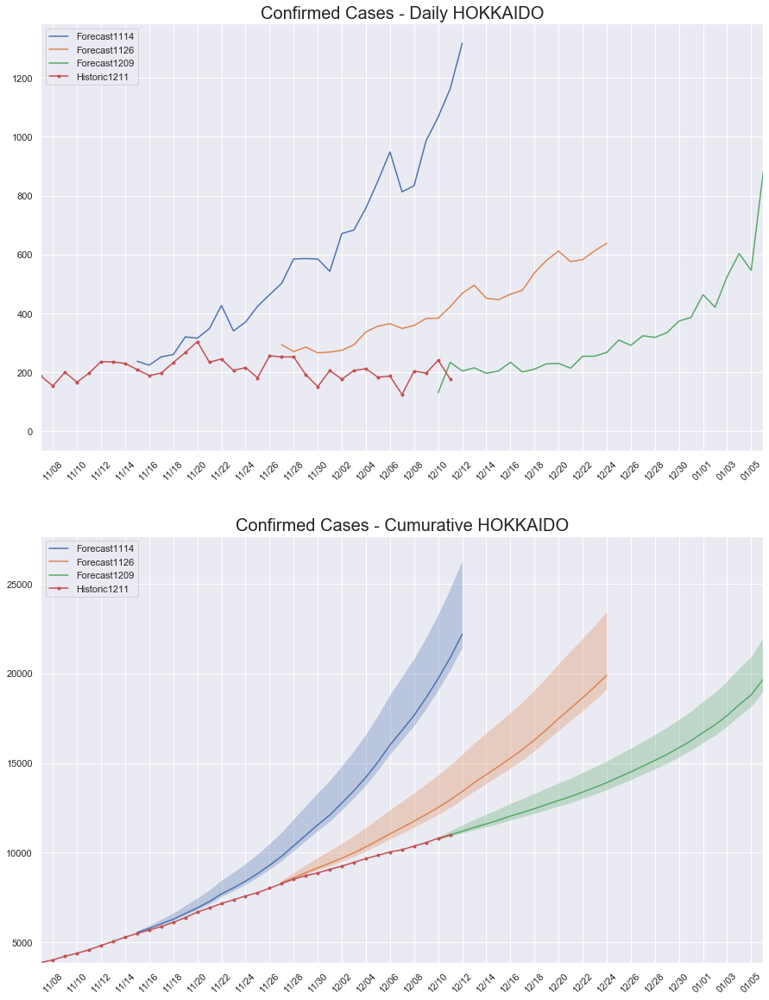

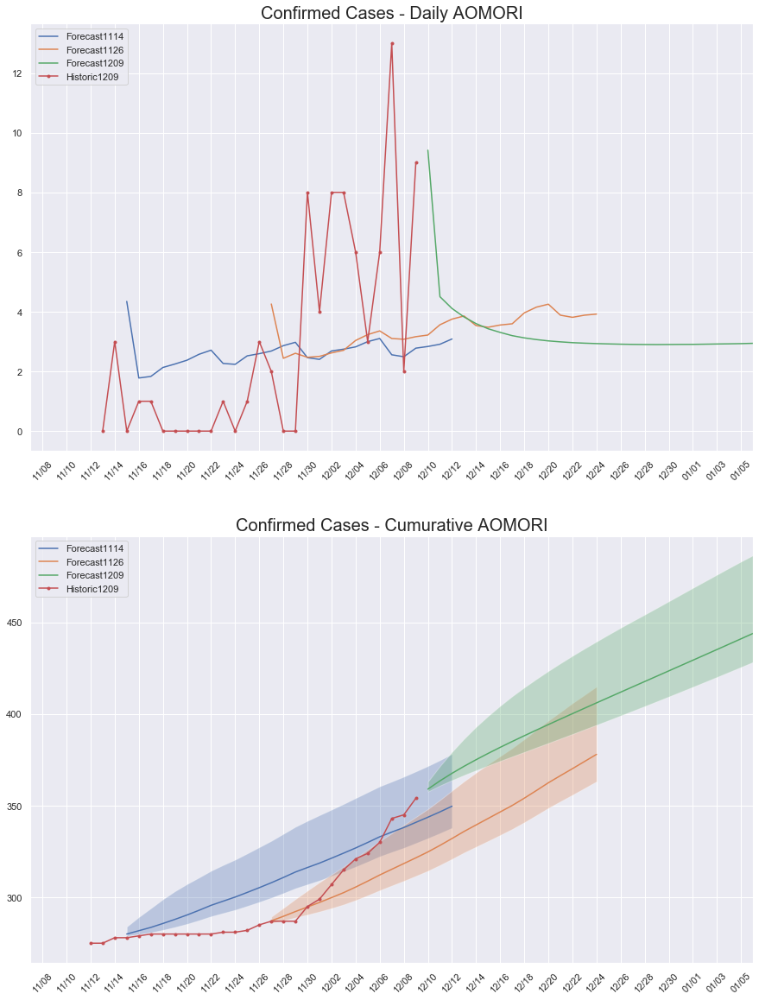

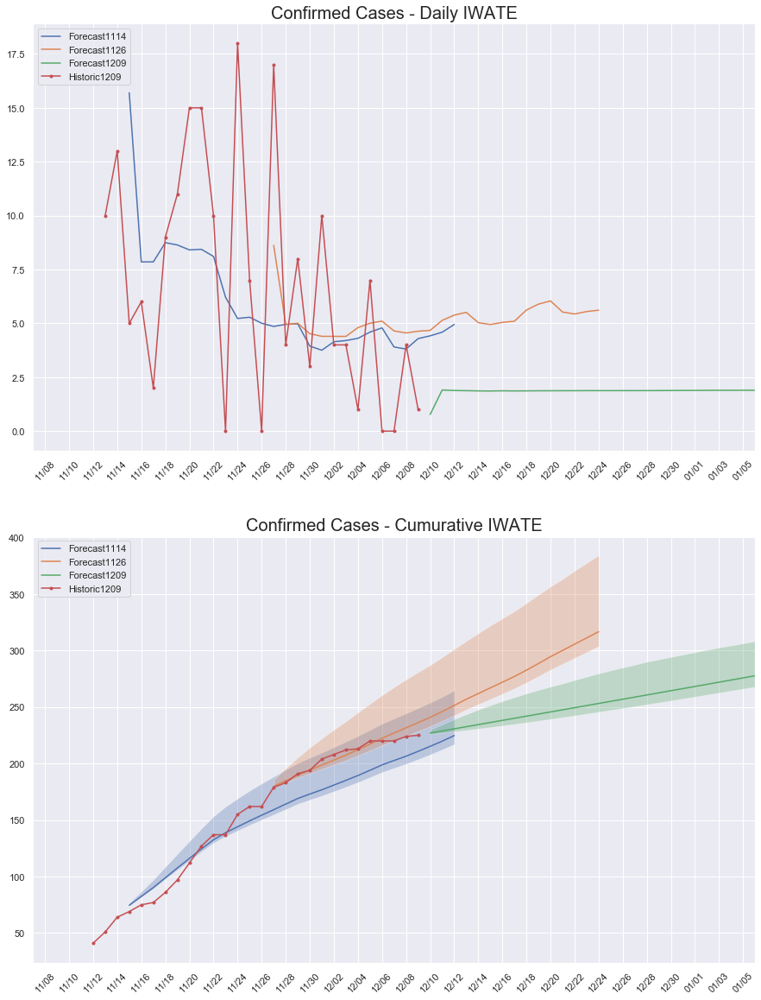

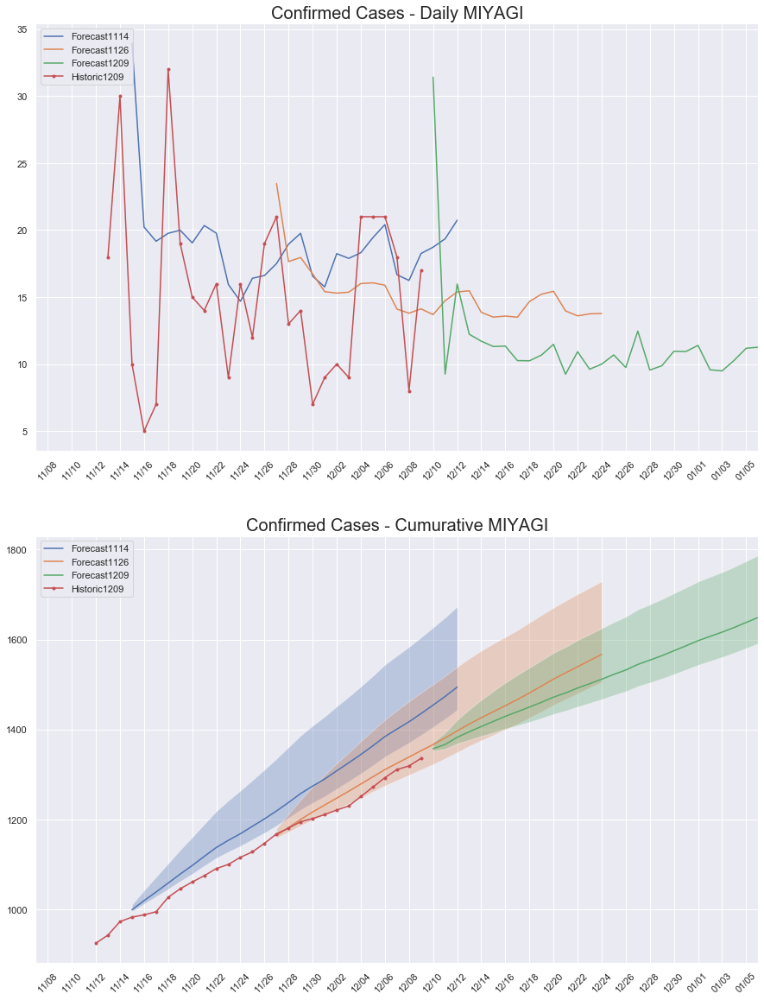

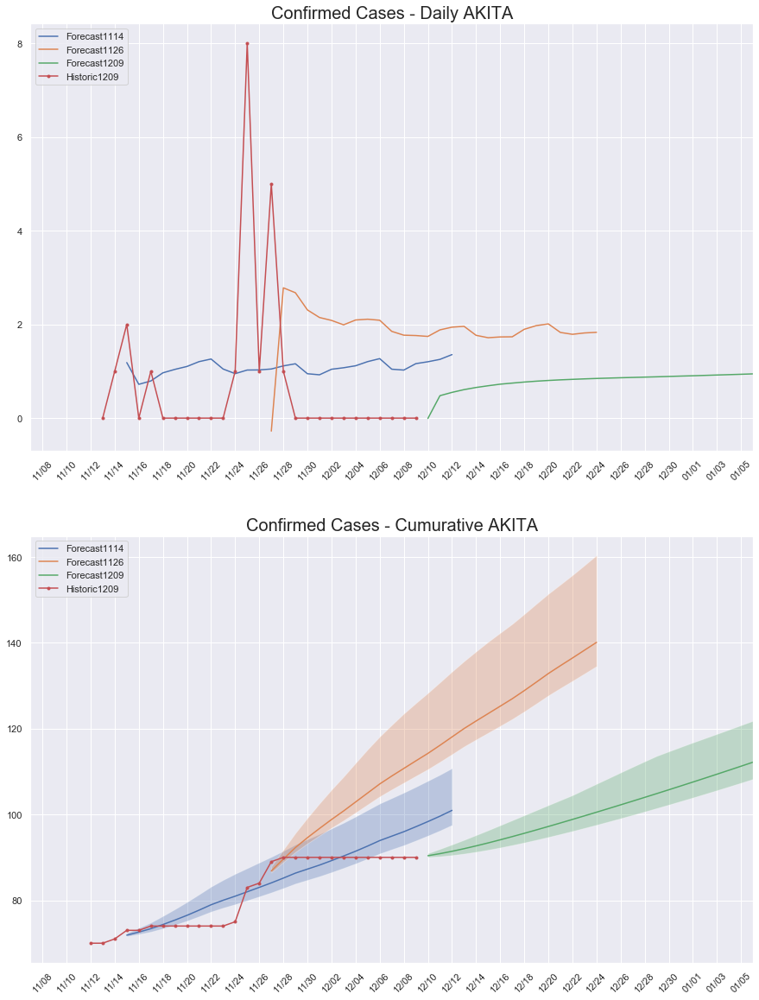

...

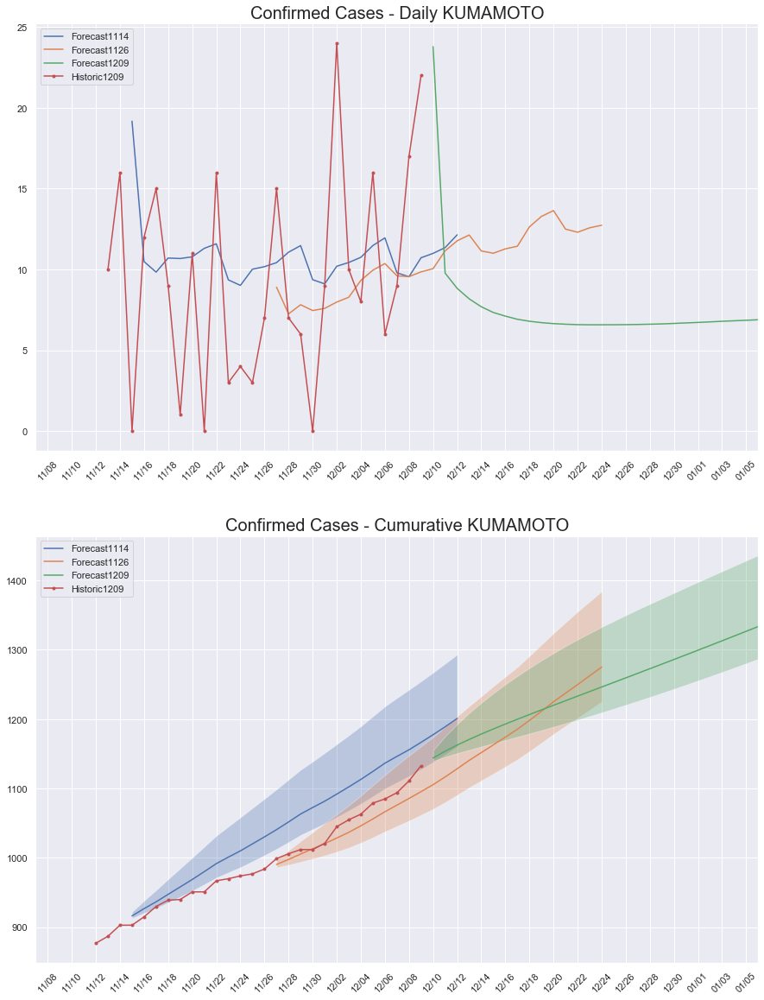

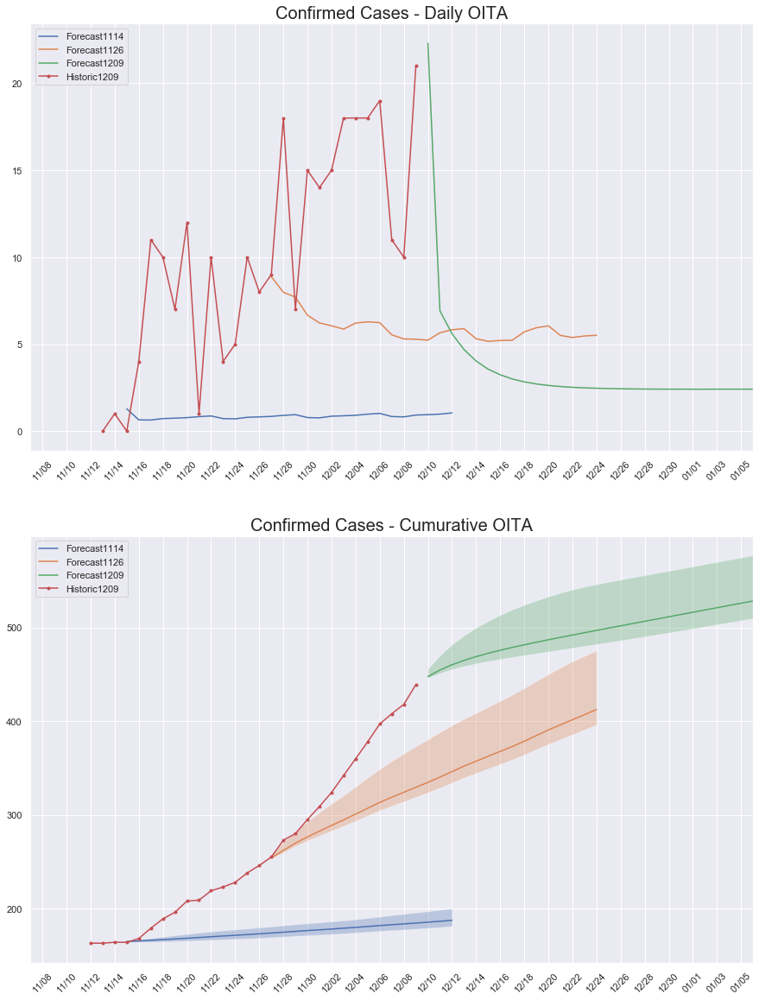

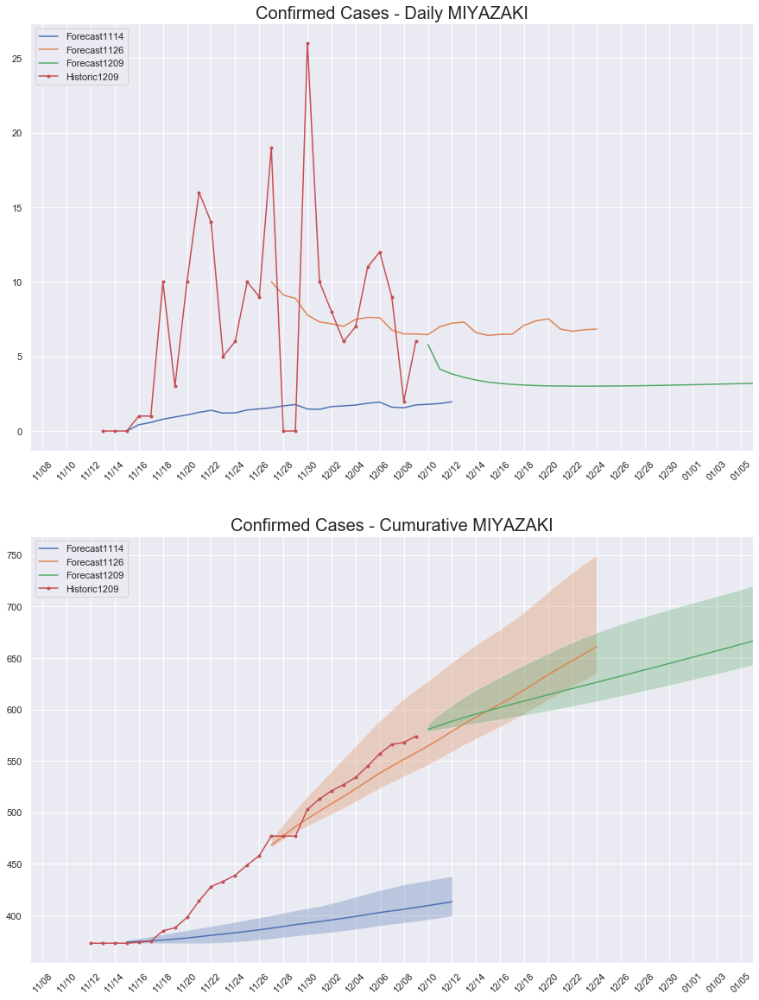

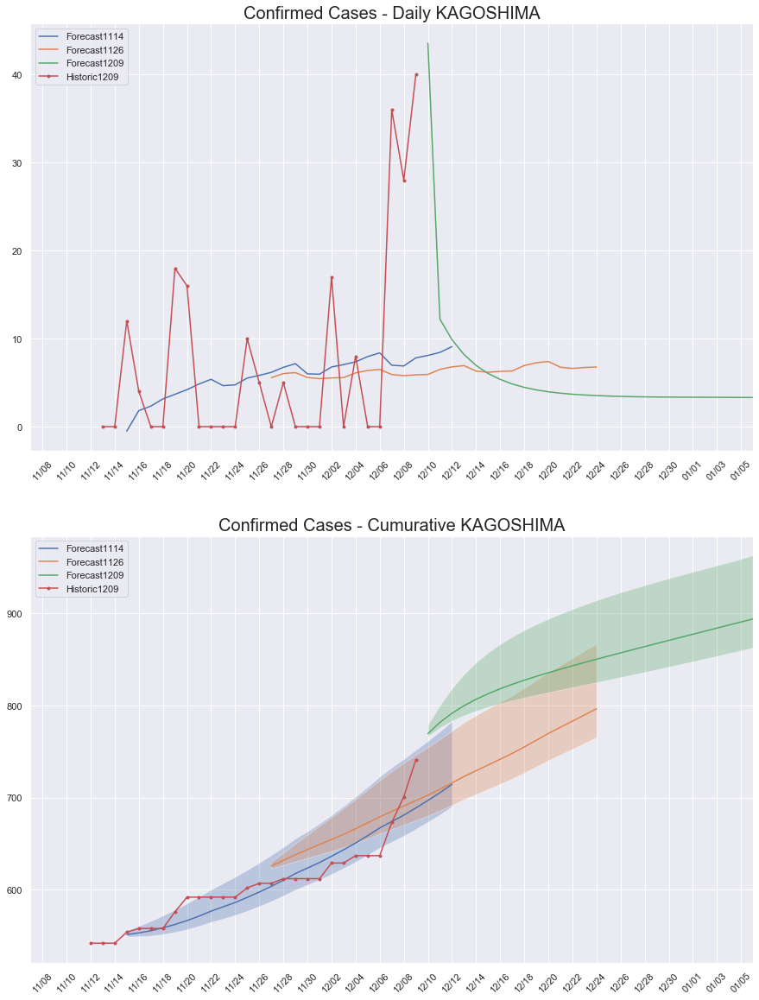

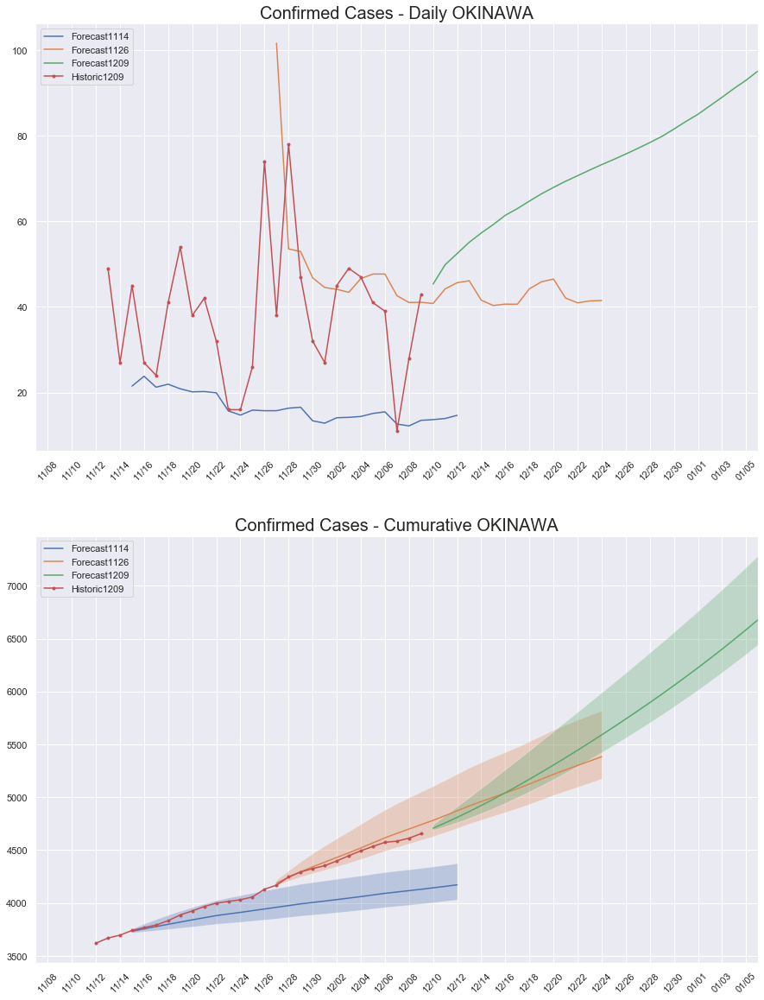

In [14]:
data = pd.read_csv("https://storage.googleapis.com/covid-external/forecast_JAPAN_PREFECTURE_28.csv")
pref_list = data["prefecture_name"].unique().tolist()

for prefecture in pref_list:
    plot_by_matplotlib(prefecture)



In [10]:
#plotly版
layout = go.Layout(title="Confirmed Cases - Cumurative "+ prefecture, width=800, height=500)
fig = go.Figure(layout=layout)
i = 0
for filename in google_files:
    date_p, pred, pred_q975, pred_q025, new_confirmed, f_date = pred_data(filename,prefecture)
    label= "Forecast" + f_date
    fig.add_trace(go.Scatter(
        x=pd.concat([date_p,date_p[::-1]]),
        y=np.concatenate([pred_q975,pred_q025[::-1]]),
        fill="toself",
        fillcolor=px.colors.qualitative.D3[i],
        opacity=0.3,
        mode="none",
        showlegend=False,
        name="95%PI" + f_date
    ))
    fig.add_trace(go.Scatter(x=date_p, y=pred, name=label,marker={"color":px.colors.qualitative.D3[i]}))

    i += 1
fig.add_trace(go.Scatter(x=date_o, y=cumulative_o, name="Historic",marker={"color":px.colors.qualitative.D3[i]}))

# Add range slider
fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1m",
                     step="month",
                     stepmode="backward"),
                dict(count=2,
                     label="2m",
                     step="month",
                     stepmode="backward"),
                dict(count=3,
                     label="3m",
                     step="month",
                     stepmode="backward"),
                dict(count=6,
                     label="6m",
                     step="month",
                     stepmode="backward"),
                dict(count=1,
                     label="1y",
                     step="year",
                     stepmode="backward"),
                dict(step="all")
            ])
        ),
        type="date"
    )
)
fig.update_layout(yaxis=dict(autorange=True))
fig.show()

In [ ]:
print(data)

In [ ]:
data_t = pd.to_datetime(data["公表_年月日"], format='%Y-%m-%d')
datelist = pd.date_range(start=data_t.min(), end=data_t.max())
observed = pd.DataFrame({"date": datelist, "confirmed": 0., "cumulative_confirmed": 0.})

for i in range(datelist.size):
    observed.iat[i,1] = sum(data_t == observed.iat[i,0])
    if i == 0:
        observed.iat[i,2] = observed.iat[i,1]
    else:
        observed.iat[i,2] = observed.iat[i-1,2] + observed.iat[i,1]

print(observed)


In [30]:
def show_pal0(palette):
    sns.palplot(sns.color_palette(palette, 24))
interact(show_pal0, palette='deep muted pastel bright dark colorblind'.split());

NameError: name 'interact' is not defined

In [ ]:
data_t.min()

In [ ]:
datelist = pd.date_range(start=data_t.min(), end=data_t.max())

In [57]:
print(datelist)

DatetimeIndex(['2020-01-24', '2020-01-25', '2020-01-26', '2020-01-27',
               '2020-01-28', '2020-01-29', '2020-01-30', '2020-01-31',
               '2020-02-01', '2020-02-02',
               ...
               '2020-11-26', '2020-11-27', '2020-11-28', '2020-11-29',
               '2020-11-30', '2020-12-01', '2020-12-02', '2020-12-03',
               '2020-12-04', '2020-12-05'],
              dtype='datetime64[ns]', length=317, freq='D')


In [ ]:
sum(data_t == data_t.max())

In [ ]:
observed = pd.DataFrame({"date": datelist, "confirmed": 0., "cumulative_confirmed": 0.})

In [ ]:
print(observed)

In [ ]:
for i in range(datelist.size):
    observed.iat[i,1] = sum(data_t == observed.iat[i,0])
    if i == 0:
        observed.iat[i,2] = observed.iat[i,1]
    else:
        observed.iat[i,2] = observed.iat[i-1,2] + observed.iat[i,1]

print(observed)
    
    

In [49]:
str(datelist[0].month)+str(datelist[0].day)

'124'

In [58]:
print(data_t)

0       2020-01-24
1       2020-01-25
2       2020-01-30
3       2020-02-13
4       2020-02-14
           ...    
43372   2020-12-05
43373   2020-12-05
43374   2020-12-05
43375   2020-12-05
43376   2020-12-05
Name: 公表_年月日, Length: 43377, dtype: datetime64[ns]
